In [1]:
%matplotlib inline
%load_ext memory_profiler

import pandas as pd
import os
import glob
import pickle
import phate
import scprep
import meld
import time
import graphtools as gt
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import scanpy as sc
from sklearn.decomposition import PCA
import math
from scipy import sparse
import sys
sys.path.append('/home/ngr4/project/scripts/')
import utils
import magic


# settings
plt.rc('font', size = 9)
plt.rc('font', family='sans serif')
plt.rcParams['pdf.fonttype']=42
plt.rcParams['ps.fonttype']=42
plt.rcParams['text.usetex']=False
plt.rcParams['legend.frameon']=False
plt.rcParams['axes.grid']=False
plt.rcParams['legend.markerscale']=0.5
sc.set_figure_params(dpi=300,dpi_save=600,
                     frameon=False,
                     fontsize=9)
plt.rcParams['savefig.dpi']=600
sc.settings.verbosity=2
sc._settings.ScanpyConfig.n_jobs=-1
sns.set_style("ticks")



In [2]:
if True:
    # do the human ones
    pdfp = '/home/ngr4/project/scnd/data/processed'
    pfp = '/home/ngr4/project/scnd/results/'

    # load human
    fname='hum_MT_bbknn.h5ad'
    %memit hdata = utils.load_adata(os.path.join(pdfp, fname))

loaded @200724.15:04:46
took 12.83-s to load data
peak memory: 10408.59 MiB, increment: 10209.51 MiB


/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,
/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  FutureWarning,


In [2]:
if True:
    # do the mouse ones
    pdfp = '/home/ngr4/project/scnd/data/processed'
    pfp = '/home/ngr4/project/scnd/results/'

    %memit wtt = utils.load_adata(os.path.join(pdfp, 'mouse_wt_imputed.h5ad'))
    %memit mutt = utils.load_adata(os.path.join(pdfp, 'mouse_sca1_imputed.h5ad'))

loaded @200724.14:09:07
took 37.74-s to load data
peak memory: 38649.03 MiB, increment: 38451.84 MiB
loaded @200724.14:09:43
took 36.23-s to load data
peak memory: 74509.96 MiB, increment: 35860.93 MiB


# Human

**GOI distributions** 

In [3]:
if True : # not encoded yet
    hdata.obs['genotype']=['SCA1' if 'SCA' in i else 'WT' for i in hdata.obs['Sample']]

In [4]:
# recalc imputation 
print('Starting imputation for {}\n'.format('WT'))
tic = time.time()

wt = sc.AnnData(hdata[hdata.obs['genotype']=='WT', :].X, obs=hdata[hdata.obs['genotype']=='WT', :].obs, var=hdata.var)
sc.pp.pca(wt)
sc.pp.neighbors(wt, n_pcs=50)


# MAGIC
G = gt.Graph(data=wt.obsp['connectivities']+sparse.diags([1]*wt.shape[0],format='csr'),
             precomputed='adjacency',
             use_pygsp=True)
G.knn_max = None

# MAGIC
magic_op=magic.MAGIC().fit(X=wt.X,graph=G) # running fit_transform produces wrong shape
wt.layers['imputed']=magic_op.transform(wt.X,genes='all_genes')

print('\n  imputation in {:.2f}-min'.format((time.time() - tic)/60))

print('\n Starting imputation for {}\n'.format('SCA1'))
tic = time.time()

mut = sc.AnnData(hdata[hdata.obs['genotype']=='SCA1', :].X, obs=hdata[hdata.obs['genotype']=='SCA1', :].obs, var=hdata.var)
sc.pp.pca(mut)
sc.pp.neighbors(mut, n_pcs=50)

# MAGIC
G = gt.Graph(data=mut.obsp['connectivities']+sparse.diags([1]*mut.shape[0],format='csr'),
             precomputed='adjacency',
             use_pygsp=True)
G.knn_max = None

# MAGIC
magic_op=magic.MAGIC().fit(X=mut.X,graph=G) # running fit_transform produces wrong shape
mut.layers['imputed']=magic_op.transform(mut.X,genes='all_genes')

print('\n  imputation in {:.2f}-min'.format((time.time() - tic)/60))

    

Starting imputation for WT

computing PCA
    with n_comps=50
    finished (0:01:22)
computing neighbors
    using 'X_pca' with n_pcs = 50


/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../conda_envs/rnavel/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../con

    finished (0:00:15)
Running MAGIC on 16865 cells and 27783 genes.
Using precomputed graph and diffusion operator...
Running MAGIC with `solver='exact'` on 27783-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.


/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/magic/magic.py:472: UserWarning: Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.
  "Input matrix contains unexpressed genes. "
/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/magic/magic.py:594: UserWarning: Running MAGIC.transform on different data to that which was used for MAGIC.fit may not produce sensible output, unless it comes from the same manifold.
  UserWarning,


Calculating imputation...
Calculated imputation in 205.84 seconds.

  imputation in 5.12-min

 Starting imputation for SCA1

computing PCA
    with n_comps=50
    finished (0:01:38)
computing neighbors
    using 'X_pca' with n_pcs = 50


/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../conda_envs/rnavel/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


    finished (0:00:11)
Running MAGIC on 24285 cells and 27783 genes.
Using precomputed graph and diffusion operator...
Running MAGIC with `solver='exact'` on 27783-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.


/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/magic/magic.py:472: UserWarning: Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.
  "Input matrix contains unexpressed genes. "
/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/magic/magic.py:594: UserWarning: Running MAGIC.transform on different data to that which was used for MAGIC.fit may not produce sensible output, unless it comes from the same manifold.
  UserWarning,


Calculating imputation...
Calculated imputation in 527.40 seconds.

  imputation in 10.68-min


In [20]:
genes_OL={
    'humOL1':[
        'MBP',
        'MOBP',
        'HAPLN2',
        'MOG',
        'PLP1',
        'MAG',
        'CNP',
        'TF',
        'ENPP6',
        'KLK6',],
    'humOL2':[
        'CADM2',
        'ERBB4',
        'PLXDC2',
        'NLGN1',
        'NCAM2',
        'ANK3',
        'QDPR',
        'FCHSD2',
        'LAMA2',
        'CCP110',],
    'humOL5':[
        'ASCL1',
        'HES1',
        'ID2',
        'ID4',
        'MYT1',
        'NKX2-2',
        'OLIG1',
        'OLIG2',
        'TCF7L2',
        'SOX9',
        'SOX10',
        'NKX6-2',
        'SOX17',
        'ZNF24',
        'ZNF488',
        'ZNF536',
        'MYRF',]}

genes_OPC={
    'humOPC3':[
        'DSCAM',
        'OPHN1',
        'EPN2',
        'SLC35F1',
        'RBFOX1',
        'SMOC1',
        'SUMF1',
        'TNR',
        'CNTNAP2',
        'MGLL',],
    'humOPC4':[
        'PCDH9',
        'LHFPL3',
        'NEAT1',
        'KCND2',
        'LRP1B',
        'ADGRB3',
        'FGF14',
        'SLC24A2',
        'NCAM2',
        'ZBTB20',],
    'humOPC5':[
        'ASCL1',
        'HES1',
        'ID2',
        'ID4',
        'MYT1',
        'NKX2-2',
        'OLIG1',
        'OLIG2',
        'TCF7L2',
        'SOX9',
        'SOX10',
        'NKX6-2',
        'SOX17',
        'ZNF24',
        'ZNF488',
        'ZNF536',
        'MYRF',]}

In [5]:
# aesthetics 
cmap_genotype={'WT':'#010101',
               'SCA1':'#ffd478'}

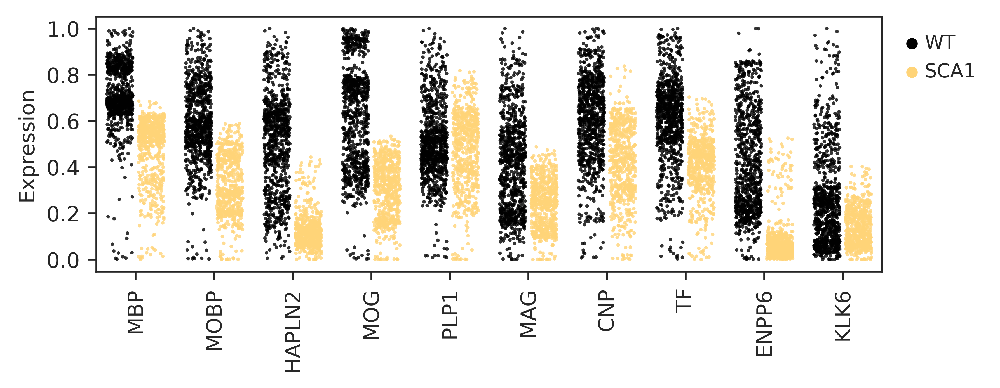

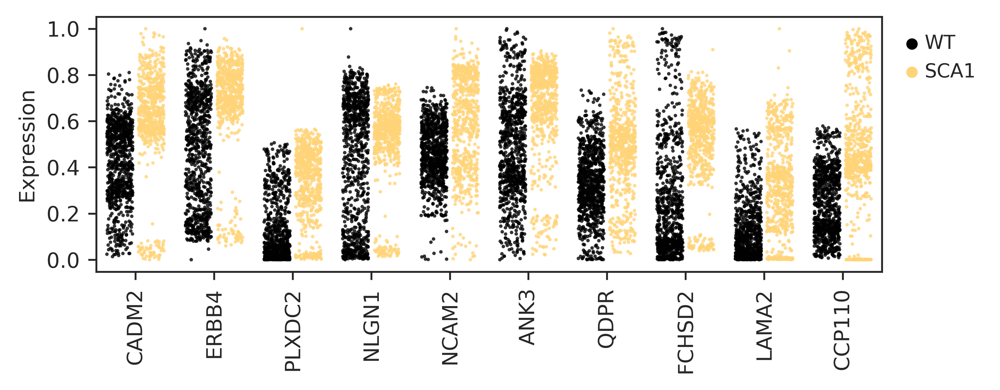

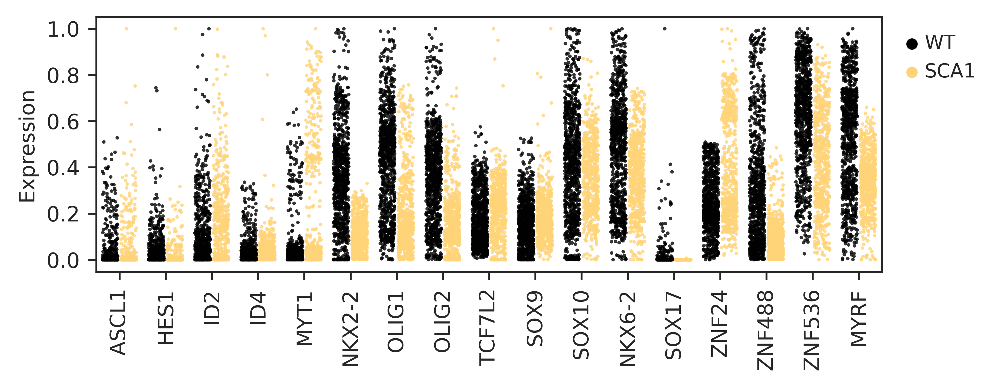

In [52]:
# human
cluster='ctype'
ctype='Oligodendrocyte'
gdict = genes_OL
norm = True

gene_list = [g for k,v in gdict.items() for g in v]
X = pd.DataFrame(wt[wt.obs[cluster]==ctype, gene_list].layers['imputed'], 
                 index=wt[wt.obs[cluster]==ctype, gene_list].obs.index.to_list(),
                 columns=gene_list)
X['genotype'] = 'WT'
X['ctype'] = ctype

x = pd.DataFrame(mut[mut.obs[cluster]==ctype, gene_list].layers['imputed'], 
                 index=mut[mut.obs[cluster]==ctype, gene_list].obs.index.to_list(),
                 columns=gene_list)
x['genotype'] = 'SCA1'
x['ctype'] = ctype

X = X.append(x)

if norm:
    X.loc[:, gene_list] = (X.loc[:, gene_list] - X.loc[:, gene_list].min(axis=0)) / (X.loc[:, gene_list].max(axis=0) - X.loc[:, gene_list].min(axis=0))
X = pd.melt(X, id_vars=['genotype', 'ctype'], value_name='Expression',var_name='Gene')

for k in gdict.keys():
    df_subset = X.loc[X['Gene'].isin(gdict[k]),:]
    
    fig,ax=plt.subplots(1,1,figsize=(6,2))
    p1 = sns.stripplot(x='Gene', y='Expression', hue='genotype', data=df_subset, order=None, hue_order=['WT','SCA1'], jitter=0.33, dodge=True, 
                      orient=None, color=None, palette=cmap_genotype, size=0.5, alpha=0.8, edgecolor='gray', linewidth=0,ax=ax,
                      rasterized=True, s=1.5)
    ax.set_xlabel('')
    ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
    ax.legend().set_title('')
    ax.legend(bbox_to_anchor=(1.01,1))
    if True :
        # save plot
        fig.savefig(os.path.join(pfp,'jitter_redo_{}.pdf'.format(k)),dpi=300, bbox_inches='tight')

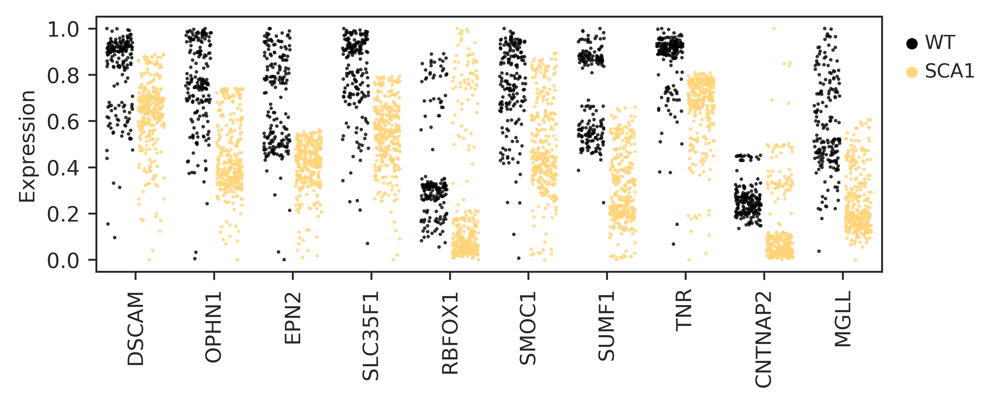

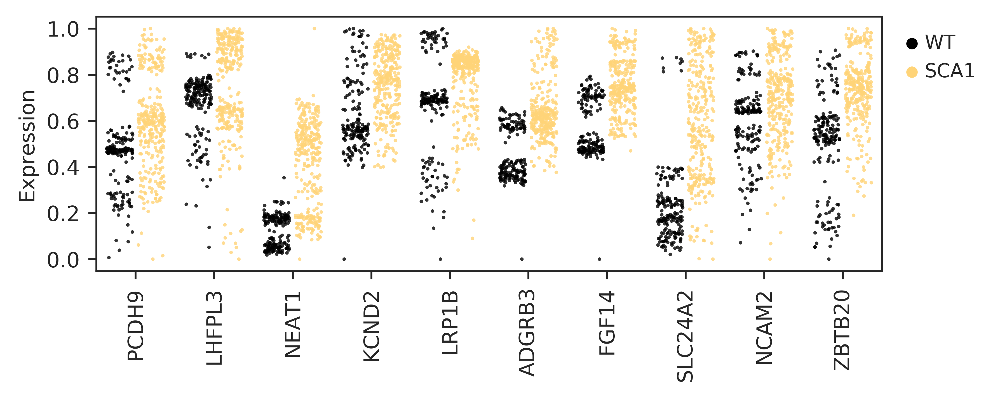

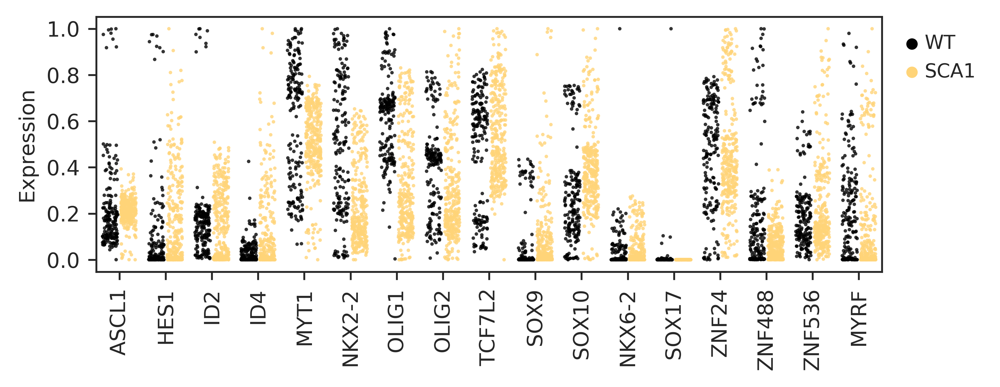

In [53]:
# human
cluster='ctype'
ctype='Oligodendrocyte progenitor cell'
gdict = genes_OPC

gene_list = [g for k,v in gdict.items() for g in v]
X = pd.DataFrame(wt[wt.obs[cluster]==ctype, gene_list].layers['imputed'], 
                 index=wt[wt.obs[cluster]==ctype, gene_list].obs.index.to_list(),
                 columns=gene_list)
X['genotype'] = 'WT'
X['ctype'] = ctype

x = pd.DataFrame(mut[mut.obs[cluster]==ctype, gene_list].layers['imputed'], 
                 index=mut[mut.obs[cluster]==ctype, gene_list].obs.index.to_list(),
                 columns=gene_list)
x['genotype'] = 'SCA1'
x['ctype'] = ctype

X = X.append(x)
if norm:
    X.loc[:, gene_list] = (X.loc[:, gene_list] - X.loc[:, gene_list].min(axis=0)) / (X.loc[:, gene_list].max(axis=0) - X.loc[:, gene_list].min(axis=0))
X = pd.melt(X, id_vars=['genotype', 'ctype'], value_name='Expression',var_name='Gene')

for k in gdict.keys():
    df_subset = X.loc[X['Gene'].isin(gdict[k]),:]
    
    fig,ax=plt.subplots(1,1,figsize=(6,2))
    p1 = sns.stripplot(x='Gene', y='Expression', hue='genotype', data=df_subset, order=None, hue_order=['WT','SCA1'], jitter=0.33, dodge=True, 
                      orient=None, color=None, palette=cmap_genotype, size=0.5, alpha=0.8, edgecolor='gray', linewidth=0,ax=ax,
                      rasterized=True, s=1.5)
    ax.set_xlabel('')
    ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
    ax.legend().set_title('')
    ax.legend(bbox_to_anchor=(1.01,1))
    if True :
        # save plot
        fig.savefig(os.path.join(pfp,'jitter_redo_{}.pdf'.format(k)),dpi=300, bbox_inches='tight')

In [6]:
genes = {
    'Human OL':[
        'DPYD', 'PPP2R2B', 'MBP', 'MOBP', 'NTM', 'S100B', 
        'FGFR2', 'HAPLN2', 'PRKCA', 'MOG', 'ZEB2', 'PLP1', 
        'ENPP6', 'MAG', 'CNP', 'CADM2', 'ERBB4', 'PLXDC2', 
        'KCNIP4', 'NLGN1', 'NCAM2', 'HSPA1A', 'ZNF385D', 
        'ANK3', 'FGF14', 'QDPR', 'CDH18', 'FCHSD2', 'LAMA2', 
        'CCP110', 'TF', 'QKI', 
    ]
}


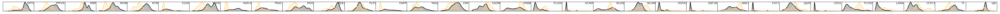

In [8]:
# mosue PC normed & unnormed (in line)
gene_list_id = 'Human OL'
cluster='ctype'
ctype='Oligodendrocyte'
norm = True

# grab the data 
gene_list = genes[gene_list_id]
df = pd.DataFrame(wt[wt.obs[cluster]==ctype, gene_list].layers['imputed'], 
                 index=wt[wt.obs[cluster]==ctype, gene_list].obs.index.to_list(),
                 columns=gene_list)
df['genotype'] = 'WT'
df['ctype'] = ctype

x = pd.DataFrame(mut[mut.obs[cluster]==ctype, gene_list].layers['imputed'], 
                 index=mut[mut.obs[cluster]==ctype, gene_list].obs.index.to_list(),
                 columns=gene_list)
x['genotype'] = 'SCA1'
x['ctype'] = ctype

df = df.append(x)
if norm:
    df.loc[:, gene_list] = (df.loc[:, gene_list] - df.loc[:, gene_list].min(axis=0)) / (df.loc[:, gene_list].max(axis=0) - df.loc[:, gene_list].min(axis=0))
df = pd.melt(df, id_vars=['genotype', 'ctype'], value_name='Expression',var_name='Gene')

# plot X

ncol = len(gene_list)
fig,axarr = plt.subplots(1,ncol,figsize=(2*ncol,3/5))

for j,g in enumerate(gene_list):
    ax = axarr[j]
    p1 = sns.kdeplot(data=df.loc[((df['Gene']==g) & (df['genotype']=='WT')),'Expression'], 
                shade=True, color=cmap_genotype['WT'], kernel='gau', bw='scott', gridsize=100, cut=3, clip=None, 
                     legend=False, cumulative=False, shade_lowest=True, cbar=False, cbar_ax=None, cbar_kws=None, ax=ax,lw=1.7)
    p2 = sns.kdeplot(data=df.loc[((df['Gene']==g) & (df['genotype']=='SCA1')),'Expression'], 
                shade=True, color=cmap_genotype['SCA1'], kernel='gau', bw='scott', gridsize=100, cut=3, clip=None, 
                     legend=False, cumulative=False, shade_lowest=True, cbar=False, cbar_ax=None, cbar_kws=None, ax=ax,lw=1.7)
    ax1 = ax.twinx()
    ax.set_xlim([-0.15, 1.15])
    ax1.set_yticks([0.,1.])
#     ax1.set_ylabel(g)
    ax.set_ylabel('')
    ax.set_yticks([])
    ax1.set_yticks([])
    ax.set_xticks([])
    ax.text(0.9,0.85,g,
            horizontalalignment='center',
            verticalalignment='center',
            transform = ax.transAxes)
#     if t=='30wk':
#         ax1.set_yticks([0.])
#     elif t=='5wk':
#         ax1.set_yticks([1.])
#     else:
#         ax1.set_yticks([])
fig.subplots_adjust(wspace=0, hspace=0)

if True :
    # save plot
    fig.savefig(os.path.join(pfp,'goi_dist_{}.pdf'.format(gene_list_id.replace(' ', ''))),dpi=300, bbox_inches='tight')
    
# # try without normalization
# df = pd.DataFrame()
# for t in mdata.obs['timepoint'].unique():
#     print('\nstarting timepoint {}\n'.format(t))
        
#     ## subset data
#     X = AnnData2df(mdata,genes[gene_list_id],layer='imputed_bbknn',
#                    id1='timepoint',id1_val=t,id2=cluster,id2_val=ctype,
#                    add_obs='genotype',scaler=None)
#     X = pd.melt(X, id_vars='genotype',value_name='Expression',var_name='Gene')
#     X['Timepoint'] = [t]*X.shape[0]

#     ## add back data
#     df = df.append(X, ignore_index=True)
#     del X

# ncol = genes[gene_list_id].__len__()
# fig,axarr = plt.subplots(5,ncol,figsize=(2*ncol,3))

# for j,g in enumerate(genes[gene_list_id]):
#     for i,t in enumerate(['5wk','12wk','18wk','24wk','30wk']) : 
#         ax = axarr[i,j]
#         # per timepoint, get min max for comparison
#         x_max = df.loc[df['Gene']==g,'Expression'].max()+0.1*df.loc[df['Gene']==g,'Expression'].max() # 1% padding
#         x_min = df.loc[df['Gene']==g,'Expression'].min()-0.1*df.loc[df['Gene']==g,'Expression'].min() # 1% padding
#         p1 = sns.kdeplot(data=df.loc[((df['Gene']==g) & (df['genotype']=='WT') & (df['Timepoint']==t)),'Expression'], 
#                     shade=True, color=cmap_genotype['WT'], kernel='gau', bw='scott', gridsize=100, cut=3, clip=None, 
#                          legend=False, cumulative=False, shade_lowest=True, cbar=False, cbar_ax=None, cbar_kws=None, ax=ax,lw=1.7)
#         p2 = sns.kdeplot(data=df.loc[((df['Gene']==g) & (df['genotype']=='SCA1') & (df['Timepoint']==t)),'Expression'], 
#                     shade=True, color=cmap_genotype['SCA1'], kernel='gau', bw='scott', gridsize=100, cut=3, clip=None, 
#                          legend=False, cumulative=False, shade_lowest=True, cbar=False, cbar_ax=None, cbar_kws=None, ax=ax,lw=1.7)
#         ax1 = ax.twinx()
#         ax1.set_yticks([0.,1.])
#     #     ax1.set_ylabel(g)
#         if j==0:
#             ax.set_ylabel(t)
#         else:
#             ax.set_ylabel('')
#         ax.set_yticks([])
#         if True :
#             # highlight differences across time
#             ax1.set_yticks([]) 
# #         if t=='30wk':
# #             ax.set_xticks([0,0.25,0.50,0.75,1])
# #         else:
# #             ax.set_xticks([])
#         ax.set_xticks([])
#         ax.set_xlim([x_min,x_max])
#         if t=='5wk':
#             x = np.min(p1.get_xbound()+p2.get_xbound())
#             y = np.max(p1.get_ybound()+p2.get_ybound())
#             ax.text(0.9,0.85,g,
#                     horizontalalignment='center',
#                     verticalalignment='center',
#                     transform = ax.transAxes)
#     #     if t=='30wk':
#     #         ax1.set_yticks([0.])
#     #     elif t=='5wk':
#     #         ax1.set_yticks([1.])
#     #     else:
#     #         ax1.set_yticks([])
# fig.subplots_adjust(wspace=0, hspace=0)

# if True :
#     # save plot
#     fig.savefig(os.path.join(pfp,'dist_{}_NotNormed.pdf'.format(gene_list_id,t)),dpi=300, bbox_inches='tight')

# MOUSE 

**GOI distributions**

## PC

In [20]:
genes = {
    'Mouse PC':['Grid2', 'Anks1b', 'Etl4', 'Fam107b', 
       'Itpr1', 'Garnl3', 'Rgs8', 'Auts2', 'Col18a1', 
       'Kcnip4', 'Car8', 'Kcnab1', 'Grid2ip', 'Cacna1a', 
       'Kcnma1', 'Meg3', 'Pcdh9', 'Tenm2', 'Lsamp', 'Cntn5', 
       'Lrp1b', 'Nlgn1', 'Lrrc4c', 'Xkr4', 'Sgcz', 'Pde1c', 
       'Cntnap2', 'Nrxn3', 'Nrxn1', 'Asic2', 'Calb1', 'Prkg1','Cadm2',],
    
    'Mouse OL':['Dpyd','Ppp2r2b','Mbp','Mobp','Ntm','S100b','Fgfr2',
         'Hapln2','Prkca','Mog','Zeb2','Plp1','Enpp6','Mag',
         'Cnp','Cadm2','Erbb4','Plxdc2','Kcnip4','Nlgn1',
         'Ncam2','Hspa1a','Ank3','Fgf14','Qdpr',
         'Cdh18','Fchsd2','Lama2','Ccp110']
}

In [21]:
# aesthetics 
cmap_genotype={'WT':'#010101',
               'SCA1':'#ffd478'}

In [22]:
# mosue PC normed & unnormed (in line)
gene_list_id = 'Mouse PC'
cluster='ctype'
ctype='Purkinje cell'
norm = True

# grab the data 
gene_list = genes[gene_list_id]
df = pd.DataFrame(wtt[wtt.obs[cluster]==ctype, gene_list].layers['imputed'], 
                 index=wtt[wtt.obs[cluster]==ctype, gene_list].obs.index.to_list(),
                 columns=gene_list)
df['genotype'] = 'WT'
df['ctype'] = ctype
df['timepoint'] = wtt[wtt.obs[cluster]==ctype, gene_list].obs['timepoint'].to_list()

x = pd.DataFrame(mutt[mutt.obs[cluster]==ctype, gene_list].layers['imputed'], 
                 index=mutt[mutt.obs[cluster]==ctype, gene_list].obs.index.to_list(),
                 columns=gene_list)
x['genotype'] = 'SCA1'
x['ctype'] = ctype
x['timepoint'] = mutt[mutt.obs[cluster]==ctype, gene_list].obs['timepoint'].to_list()

df = df.append(x)
if norm:
    df.loc[:, gene_list] = (df.loc[:, gene_list] - df.loc[:, gene_list].min(axis=0)) / (df.loc[:, gene_list].max(axis=0) - df.loc[:, gene_list].min(axis=0))
df = pd.melt(df, id_vars=['genotype', 'timepoint', 'ctype'], value_name='Expression',var_name='Gene')




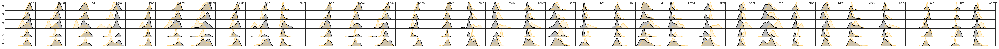

In [23]:
# mosue PC normed & unnormed (in line)
gene_list_id = 'Mouse PC'
cluster='ctype'
ctype='Purkinje cell'
norm = True

# grab the data 
gene_list = genes[gene_list_id]
df = pd.DataFrame(wtt[wtt.obs[cluster]==ctype, gene_list].layers['imputed'], 
                 index=wtt[wtt.obs[cluster]==ctype, gene_list].obs.index.to_list(),
                 columns=gene_list)
df['genotype'] = 'WT'
df['ctype'] = ctype
df['timepoint'] = wtt[wtt.obs[cluster]==ctype, gene_list].obs['timepoint'].to_list()

x = pd.DataFrame(mutt[mutt.obs[cluster]==ctype, gene_list].layers['imputed'], 
                 index=mutt[mutt.obs[cluster]==ctype, gene_list].obs.index.to_list(),
                 columns=gene_list)
x['genotype'] = 'SCA1'
x['ctype'] = ctype
x['timepoint'] = mutt[mutt.obs[cluster]==ctype, gene_list].obs['timepoint'].to_list()

df = df.append(x)
if norm:
    df.loc[:, gene_list] = (df.loc[:, gene_list] - df.loc[:, gene_list].min(axis=0)) / (df.loc[:, gene_list].max(axis=0) - df.loc[:, gene_list].min(axis=0))
df = pd.melt(df, id_vars=['genotype', 'timepoint', 'ctype'], value_name='Expression',var_name='Gene')

# plot X

ncol = len(gene_list)
fig,axarr = plt.subplots(5,ncol,figsize=(2*ncol,3))

for j,g in enumerate(gene_list):
    for i,t in enumerate(['5wk','12wk','18wk','24wk','30wk']) : 
        ax = axarr[i,j]
        p1 = sns.kdeplot(data=df.loc[((df['Gene']==g) & (df['genotype']=='WT') & (df['timepoint']==t)),'Expression'], 
                    shade=True, color=cmap_genotype['WT'], kernel='gau', bw='scott', gridsize=100, cut=3, clip=None, 
                         legend=False, cumulative=False, shade_lowest=True, cbar=False, cbar_ax=None, cbar_kws=None, ax=ax,lw=1.7)
        p2 = sns.kdeplot(data=df.loc[((df['Gene']==g) & (df['genotype']=='SCA1') & (df['timepoint']==t)),'Expression'], 
                    shade=True, color=cmap_genotype['SCA1'], kernel='gau', bw='scott', gridsize=100, cut=3, clip=None, 
                         legend=False, cumulative=False, shade_lowest=True, cbar=False, cbar_ax=None, cbar_kws=None, ax=ax,lw=1.7)
        ax1 = ax.twinx()
        ax.set_xlim([-0.15, 1.15])
        ax1.set_yticks([0.,1.])
    #     ax1.set_ylabel(g)
        if j==0:
            ax.set_ylabel(t)
        else:
            ax.set_ylabel('')
        ax.set_yticks([])
        ax1.set_yticks([])
#         if t=='30wk':
#             ax.set_xticks([0,0.25,0.50,0.75,1])
#         else:
#             ax.set_xticks([])
        ax.set_xticks([])
        if t=='5wk':
            x = np.min(p1.get_xbound()+p2.get_xbound())
            y = np.max(p1.get_ybound()+p2.get_ybound())
            ax.text(0.9,0.85,g,
                    horizontalalignment='center',
                    verticalalignment='center',
                    transform = ax.transAxes)
    #     if t=='30wk':
    #         ax1.set_yticks([0.])
    #     elif t=='5wk':
    #         ax1.set_yticks([1.])
    #     else:
    #         ax1.set_yticks([])
fig.subplots_adjust(wspace=0, hspace=0)

if True :
    # save plot
    fig.savefig(os.path.join(pfp,'goi_dist_{}.pdf'.format(gene_list_id.replace(' ', ''))),dpi=300, bbox_inches='tight')
    
# # try without normalization
# df = pd.DataFrame()
# for t in mdata.obs['timepoint'].unique():
#     print('\nstarting timepoint {}\n'.format(t))
        
#     ## subset data
#     X = AnnData2df(mdata,genes[gene_list_id],layer='imputed_bbknn',
#                    id1='timepoint',id1_val=t,id2=cluster,id2_val=ctype,
#                    add_obs='genotype',scaler=None)
#     X = pd.melt(X, id_vars='genotype',value_name='Expression',var_name='Gene')
#     X['Timepoint'] = [t]*X.shape[0]

#     ## add back data
#     df = df.append(X, ignore_index=True)
#     del X

# ncol = genes[gene_list_id].__len__()
# fig,axarr = plt.subplots(5,ncol,figsize=(2*ncol,3))

# for j,g in enumerate(genes[gene_list_id]):
#     for i,t in enumerate(['5wk','12wk','18wk','24wk','30wk']) : 
#         ax = axarr[i,j]
#         # per timepoint, get min max for comparison
#         x_max = df.loc[df['Gene']==g,'Expression'].max()+0.1*df.loc[df['Gene']==g,'Expression'].max() # 1% padding
#         x_min = df.loc[df['Gene']==g,'Expression'].min()-0.1*df.loc[df['Gene']==g,'Expression'].min() # 1% padding
#         p1 = sns.kdeplot(data=df.loc[((df['Gene']==g) & (df['genotype']=='WT') & (df['Timepoint']==t)),'Expression'], 
#                     shade=True, color=cmap_genotype['WT'], kernel='gau', bw='scott', gridsize=100, cut=3, clip=None, 
#                          legend=False, cumulative=False, shade_lowest=True, cbar=False, cbar_ax=None, cbar_kws=None, ax=ax,lw=1.7)
#         p2 = sns.kdeplot(data=df.loc[((df['Gene']==g) & (df['genotype']=='SCA1') & (df['Timepoint']==t)),'Expression'], 
#                     shade=True, color=cmap_genotype['SCA1'], kernel='gau', bw='scott', gridsize=100, cut=3, clip=None, 
#                          legend=False, cumulative=False, shade_lowest=True, cbar=False, cbar_ax=None, cbar_kws=None, ax=ax,lw=1.7)
#         ax1 = ax.twinx()
#         ax1.set_yticks([0.,1.])
#     #     ax1.set_ylabel(g)
#         if j==0:
#             ax.set_ylabel(t)
#         else:
#             ax.set_ylabel('')
#         ax.set_yticks([])
#         if True :
#             # highlight differences across time
#             ax1.set_yticks([]) 
# #         if t=='30wk':
# #             ax.set_xticks([0,0.25,0.50,0.75,1])
# #         else:
# #             ax.set_xticks([])
#         ax.set_xticks([])
#         ax.set_xlim([x_min,x_max])
#         if t=='5wk':
#             x = np.min(p1.get_xbound()+p2.get_xbound())
#             y = np.max(p1.get_ybound()+p2.get_ybound())
#             ax.text(0.9,0.85,g,
#                     horizontalalignment='center',
#                     verticalalignment='center',
#                     transform = ax.transAxes)
#     #     if t=='30wk':
#     #         ax1.set_yticks([0.])
#     #     elif t=='5wk':
#     #         ax1.set_yticks([1.])
#     #     else:
#     #         ax1.set_yticks([])
# fig.subplots_adjust(wspace=0, hspace=0)

# if True :
#     # save plot
#     fig.savefig(os.path.join(pfp,'dist_{}_NotNormed.pdf'.format(gene_list_id,t)),dpi=300, bbox_inches='tight')

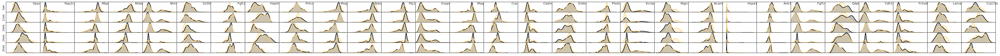

In [24]:
# mosue PC normed & unnormed (in line)
gene_list_id = 'Mouse OL'
cluster='ctype'
ctype='Oligodendrocyte'
norm = True

# grab the data 
gene_list = genes[gene_list_id]
df = pd.DataFrame(wtt[wtt.obs[cluster]==ctype, gene_list].layers['imputed'], 
                 index=wtt[wtt.obs[cluster]==ctype, gene_list].obs.index.to_list(),
                 columns=gene_list)
df['genotype'] = 'WT'
df['ctype'] = ctype
df['timepoint'] = wtt[wtt.obs[cluster]==ctype, gene_list].obs['timepoint'].to_list()

x = pd.DataFrame(mutt[mutt.obs[cluster]==ctype, gene_list].layers['imputed'], 
                 index=mutt[mutt.obs[cluster]==ctype, gene_list].obs.index.to_list(),
                 columns=gene_list)
x['genotype'] = 'SCA1'
x['ctype'] = ctype
x['timepoint'] = mutt[mutt.obs[cluster]==ctype, gene_list].obs['timepoint'].to_list()

df = df.append(x)
if norm:
    df.loc[:, gene_list] = (df.loc[:, gene_list] - df.loc[:, gene_list].min(axis=0)) / (df.loc[:, gene_list].max(axis=0) - df.loc[:, gene_list].min(axis=0))
df = pd.melt(df, id_vars=['genotype', 'timepoint', 'ctype'], value_name='Expression',var_name='Gene')

# plot X

ncol = len(gene_list)
fig,axarr = plt.subplots(5,ncol,figsize=(2*ncol,3))

for j,g in enumerate(gene_list):
    for i,t in enumerate(['5wk','12wk','18wk','24wk','30wk']) : 
        ax = axarr[i,j]
        p1 = sns.kdeplot(data=df.loc[((df['Gene']==g) & (df['genotype']=='WT') & (df['timepoint']==t)),'Expression'], 
                    shade=True, color=cmap_genotype['WT'], kernel='gau', bw='scott', gridsize=100, cut=3, clip=None, 
                         legend=False, cumulative=False, shade_lowest=True, cbar=False, cbar_ax=None, cbar_kws=None, ax=ax,lw=1.7)
        p2 = sns.kdeplot(data=df.loc[((df['Gene']==g) & (df['genotype']=='SCA1') & (df['timepoint']==t)),'Expression'], 
                    shade=True, color=cmap_genotype['SCA1'], kernel='gau', bw='scott', gridsize=100, cut=3, clip=None, 
                         legend=False, cumulative=False, shade_lowest=True, cbar=False, cbar_ax=None, cbar_kws=None, ax=ax,lw=1.7)
        ax1 = ax.twinx()
        ax.set_xlim([-0.15, 1.15])
        ax1.set_yticks([0.,1.])
    #     ax1.set_ylabel(g)
        if j==0:
            ax.set_ylabel(t)
        else:
            ax.set_ylabel('')
        ax.set_yticks([])
        ax1.set_yticks([])
#         if t=='30wk':
#             ax.set_xticks([0,0.25,0.50,0.75,1])
#         else:
#             ax.set_xticks([])
        ax.set_xticks([])
        if t=='5wk':
            x = np.min(p1.get_xbound()+p2.get_xbound())
            y = np.max(p1.get_ybound()+p2.get_ybound())
            ax.text(0.9,0.85,g,
                    horizontalalignment='center',
                    verticalalignment='center',
                    transform = ax.transAxes)
    #     if t=='30wk':
    #         ax1.set_yticks([0.])
    #     elif t=='5wk':
    #         ax1.set_yticks([1.])
    #     else:
    #         ax1.set_yticks([])
fig.subplots_adjust(wspace=0, hspace=0)

if True :
    # save plot
    fig.savefig(os.path.join(pfp,'goi_dist_{}.pdf'.format(gene_list_id.replace(' ', ''))),dpi=300, bbox_inches='tight')
    
# # try without normalization
# df = pd.DataFrame()
# for t in mdata.obs['timepoint'].unique():
#     print('\nstarting timepoint {}\n'.format(t))
        
#     ## subset data
#     X = AnnData2df(mdata,genes[gene_list_id],layer='imputed_bbknn',
#                    id1='timepoint',id1_val=t,id2=cluster,id2_val=ctype,
#                    add_obs='genotype',scaler=None)
#     X = pd.melt(X, id_vars='genotype',value_name='Expression',var_name='Gene')
#     X['Timepoint'] = [t]*X.shape[0]

#     ## add back data
#     df = df.append(X, ignore_index=True)
#     del X

# ncol = genes[gene_list_id].__len__()
# fig,axarr = plt.subplots(5,ncol,figsize=(2*ncol,3))

# for j,g in enumerate(genes[gene_list_id]):
#     for i,t in enumerate(['5wk','12wk','18wk','24wk','30wk']) : 
#         ax = axarr[i,j]
#         # per timepoint, get min max for comparison
#         x_max = df.loc[df['Gene']==g,'Expression'].max()+0.1*df.loc[df['Gene']==g,'Expression'].max() # 1% padding
#         x_min = df.loc[df['Gene']==g,'Expression'].min()-0.1*df.loc[df['Gene']==g,'Expression'].min() # 1% padding
#         p1 = sns.kdeplot(data=df.loc[((df['Gene']==g) & (df['genotype']=='WT') & (df['Timepoint']==t)),'Expression'], 
#                     shade=True, color=cmap_genotype['WT'], kernel='gau', bw='scott', gridsize=100, cut=3, clip=None, 
#                          legend=False, cumulative=False, shade_lowest=True, cbar=False, cbar_ax=None, cbar_kws=None, ax=ax,lw=1.7)
#         p2 = sns.kdeplot(data=df.loc[((df['Gene']==g) & (df['genotype']=='SCA1') & (df['Timepoint']==t)),'Expression'], 
#                     shade=True, color=cmap_genotype['SCA1'], kernel='gau', bw='scott', gridsize=100, cut=3, clip=None, 
#                          legend=False, cumulative=False, shade_lowest=True, cbar=False, cbar_ax=None, cbar_kws=None, ax=ax,lw=1.7)
#         ax1 = ax.twinx()
#         ax1.set_yticks([0.,1.])
#     #     ax1.set_ylabel(g)
#         if j==0:
#             ax.set_ylabel(t)
#         else:
#             ax.set_ylabel('')
#         ax.set_yticks([])
#         if True :
#             # highlight differences across time
#             ax1.set_yticks([]) 
# #         if t=='30wk':
# #             ax.set_xticks([0,0.25,0.50,0.75,1])
# #         else:
# #             ax.set_xticks([])
#         ax.set_xticks([])
#         ax.set_xlim([x_min,x_max])
#         if t=='5wk':
#             x = np.min(p1.get_xbound()+p2.get_xbound())
#             y = np.max(p1.get_ybound()+p2.get_ybound())
#             ax.text(0.9,0.85,g,
#                     horizontalalignment='center',
#                     verticalalignment='center',
#                     transform = ax.transAxes)
#     #     if t=='30wk':
#     #         ax1.set_yticks([0.])
#     #     elif t=='5wk':
#     #         ax1.set_yticks([1.])
#     #     else:
#     #         ax1.set_yticks([])
# fig.subplots_adjust(wspace=0, hspace=0)

# if True :
#     # save plot
#     fig.savefig(os.path.join(pfp,'dist_{}_NotNormed.pdf'.format(gene_list_id,t)),dpi=300, bbox_inches='tight')